# 브라질 이커머스 데이터 분석
**[목적]** 이커머스 데이터셋을 활용해, 고객 만족도에 영향을 미치는 핵심 요인을 파악하고, RFM 분석을 통해 우수 고객(VIP)과 이탈 고객(Churn)의 특징을 비교하여 실질적인 비즈니스 전략 도출

**[핵심 분석 결과]**

배송이 고객 경험을 좌우한다: 고객 리뷰 점수(review_score)는 '배송 시간'(delivery_time)과 가장 강력한 음의 상관관계를 보였습니다. 특히 R=3 그룹(중간 고객)의 1점 리뷰가 높은 원인은, 해당 그룹의 평균 배송 시간이 24일로 전 그룹 중 가장 길었기 때문임을 입증했습니다.

VIP와 이탈 고객은 완전히 다른 고객이다: RFM 분석 결과, VIP 고객(555)은 '생활용품', '뷰티' 등 다양한 카테고리를 반복 구매했으나, 이탈 고객(111)은 '전자제품' 등 일회성 구매에 집중되었습니다.

"만족한 이탈"의 문제: 이탈 고객의 리뷰 점수는 4.10점으로, 전체 평균(4.01점)보다 높았습니다. 이는 "상품에는 만족했지만, 재구매로 이어지지 않는" 1회성 고객 관리가 핵심 과제임을 시사합니다.

지리적 집중도: 매출과 VIP 고객은 브라질 남동부(SP, MG)에 압도적으로 집중되어 있어, 해당 지역의 물류/마케팅 투자가 중요함을 확인했습니다.

**[사용 기술]**

분석: Python, Pandas, Numpy

시각화: Matplotlib, Seaborn, WordCloud, Folium (Heatmap & Choropleth)

기법: EDA, RFM (Rank & Qcut), Geospatial Analysis

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/br-states/br_states.json
/kaggle/input/brazilian-ecommerce/olist_customers_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_sellers_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_order_reviews_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_order_items_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_products_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_geolocation_dataset.csv
/kaggle/input/brazilian-ecommerce/product_category_name_translation.csv
/kaggle/input/brazilian-ecommerce/olist_orders_dataset.csv
/kaggle/input/brazilian-ecommerce/olist_order_payments_dataset.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
from PIL import Image
import folium
from folium.plugins import HeatMap
%matplotlib inline

In [3]:
file_path = '/kaggle/input/brazilian-ecommerce/'
df_oc = pd.read_csv(file_path + 'olist_customers_dataset.csv')
df_os = pd.read_csv(file_path + 'olist_sellers_dataset.csv')
df_oor = pd.read_csv(file_path + 'olist_order_reviews_dataset.csv')
df_ooi = pd.read_csv(file_path + 'olist_order_items_dataset.csv')
df_op = pd.read_csv(file_path + 'olist_products_dataset.csv')
df_og = pd.read_csv(file_path + 'olist_geolocation_dataset.csv')
df_pcnt = pd.read_csv(file_path + 'product_category_name_translation.csv')
df_oo = pd.read_csv(file_path + 'olist_orders_dataset.csv')
df_oop = pd.read_csv(file_path + 'olist_order_payments_dataset.csv')

# Data Preprocessing

In [4]:
df_dict = { 
    'df_oc': df_oc, 'df_os': df_os, 'df_oor': df_oor, 'df_ooi': df_ooi, 'df_op': df_op, 
    'df_og': df_og, 'df_pcnt': df_pcnt, 'df_oo': df_oo, 'df_oop': df_oop
}
for name, df in df_dict.items():
    print(name)
    print(df.isnull().sum().sum())

df_oc
0
df_os
0
df_oor
145903
df_ooi
0
df_op
2448
df_og
0
df_pcnt
0
df_oo
4908
df_oop
0


Null을 포함하고 있는 데이터 확인

In [5]:
df_op.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [6]:
df_op.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [7]:
df_op.isnull().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

Null을 포함하고 있는 열 확인

In [8]:
df_op[df_op['product_weight_g'].isnull()]

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df_op['product_weight_g'] = df_op['product_weight_g'].fillna(df_op['product_weight_g'].median())
df_op['product_length_cm'] = df_op['product_length_cm'].fillna(df_op['product_length_cm'].median())
df_op['product_height_cm'] = df_op['product_height_cm'].fillna(df_op['product_height_cm'].median())
df_op['product_width_cm'] = df_op['product_width_cm'].fillna(df_op['product_width_cm'].median())

수치와 관련하여 누락된 데이터는 2개밖에 없으므로 중간값을 활용하여 대체

In [10]:
df_op['product_category_name'] = df_op['product_category_name'].fillna('Unknown')
df_op['product_name_lenght'] = df_op['product_name_lenght'].fillna(0.0)
df_op['product_description_lenght'] = df_op['product_description_lenght'].fillna(0.0)
df_op['product_photos_qty'] = df_op['product_photos_qty'].fillna(0.0)

위 항목은 610개의 누락이 존재하여 대체값을 넣으면 원본 데이터의 정보를 훼손할 수 있음  
따라서 카테고리 이름은 Unknown으로, 그 외 수치에 대해선 0으로 대체

In [11]:
df_op.isnull().sum()

product_id                    0
product_category_name         0
product_name_lenght           0
product_description_lenght    0
product_photos_qty            0
product_weight_g              0
product_length_cm             0
product_height_cm             0
product_width_cm              0
dtype: int64

In [12]:
df_op = pd.merge(df_op, df_pcnt, on = 'product_category_name', how = 'left')

product_category_name을 기준으로 조인하여 병합해줌

In [13]:
df_op.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,housewares


In [14]:
df_oc.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [15]:
df_oc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [16]:
df_og.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


In [17]:
df_og.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [18]:
df_ooi.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [19]:
df_ooi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [20]:
df_oop.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


In [21]:
df_oop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [22]:
df_oor.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


In [23]:
df_oor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


다수의 Null이 존재하지만 Null 자체로서 의미가 있기에 대체하지 않음

In [24]:
df_oor['review_creation_date'] = pd.to_datetime(df_oor['review_creation_date'])
df_oor['review_answer_timestamp'] = pd.to_datetime(df_oor['review_answer_timestamp'])

In [25]:
df_oor['review_creation_year'] = df_oor['review_creation_date'].dt.year
df_oor['review_creation_month'] = df_oor['review_creation_date'].dt.month
df_oor['review_creation_day'] = df_oor['review_creation_date'].dt.day
df_oor['review_answer_year'] = df_oor['review_answer_timestamp'].dt.year
df_oor['review_answer_month'] = df_oor['review_answer_timestamp'].dt.month
df_oor['review_answer_day'] = df_oor['review_answer_timestamp'].dt.day

날짜 데이터를 계산 및 시각화 위해 자료형 및 구조 변형

In [26]:
df_oor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
 7   review_creation_year     99224 non-null  int32         
 8   review_creation_month    99224 non-null  int32         
 9   review_creation_day      99224 non-null  int32         
 10  review_answer_year       99224 non-null  int32         
 11  review_answer_month      99224 non-null  int32         
 12  review_answer_day        99224 n

In [27]:
df_oo.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [28]:
df_oo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [29]:
df_oo['order_status'].value_counts()

order_status
delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: count, dtype: int64

In [30]:
null_row = df_oo['order_approved_at'].isnull() | df_oo['order_delivered_carrier_date'].isnull() | df_oo['order_delivered_customer_date'].isnull()
df_null = df_oo[null_row][['order_status', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date']]
df_null['order_status'].value_counts()

order_status
shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered        23
created           5
approved          2
Name: count, dtype: int64

In [31]:
for status in df_null['order_status'].value_counts().index:
    print('Status :', status)
    print(df_null[df_null['order_status'] == status].isnull().sum())
    print()

Status : shipped
order_status                        0
order_approved_at                   0
order_delivered_carrier_date        0
order_delivered_customer_date    1107
dtype: int64

Status : canceled
order_status                       0
order_approved_at                141
order_delivered_carrier_date     550
order_delivered_customer_date    619
dtype: int64

Status : unavailable
order_status                       0
order_approved_at                  0
order_delivered_carrier_date     609
order_delivered_customer_date    609
dtype: int64

Status : invoiced
order_status                       0
order_approved_at                  0
order_delivered_carrier_date     314
order_delivered_customer_date    314
dtype: int64

Status : processing
order_status                       0
order_approved_at                  0
order_delivered_carrier_date     301
order_delivered_customer_date    301
dtype: int64

Status : delivered
order_status                      0
order_approved_at                14
o

order_status에 따라 아직 도착하지 않은 상태의 배송은 Null이 존재  
하지만 이미 배달 완료된 delivered에 대해서 오류성 Null의 존재도 확인

In [32]:
df_oo['order_purchase_timestamp'] = pd.to_datetime(df_oo['order_purchase_timestamp'])
df_oo['order_approved_at'] = pd.to_datetime(df_oo['order_approved_at'])
df_oo['order_delivered_carrier_date'] = pd.to_datetime(df_oo['order_delivered_carrier_date'])
df_oo['order_delivered_customer_date'] = pd.to_datetime(df_oo['order_delivered_customer_date'])
df_oo['order_estimated_delivery_date'] = pd.to_datetime(df_oo['order_estimated_delivery_date'])

In [33]:
df_oo['order_purchase_year'] = df_oo['order_purchase_timestamp'].dt.year
df_oo['order_purchase_month'] = df_oo['order_purchase_timestamp'].dt.month
df_oo['order_purchase_day'] = df_oo['order_purchase_timestamp'].dt.day
df_oo['order_approved_year'] = df_oo['order_approved_at'].dt.year
df_oo['order_approved_month'] = df_oo['order_approved_at'].dt.month
df_oo['order_approved_day'] = df_oo['order_approved_at'].dt.day
df_oo['order_delivered_carrier_year'] = df_oo['order_delivered_carrier_date'].dt.year
df_oo['order_delivered_carrier_month'] = df_oo['order_delivered_carrier_date'].dt.month
df_oo['order_delivered_carrier_day'] = df_oo['order_delivered_carrier_date'].dt.day
df_oo['order_delivered_customer_year'] = df_oo['order_delivered_customer_date'].dt.year
df_oo['order_delivered_customer_month'] = df_oo['order_delivered_customer_date'].dt.month
df_oo['order_delivered_customer_day'] = df_oo['order_delivered_customer_date'].dt.day
df_oo['order_estimated_delivery_year'] = df_oo['order_estimated_delivery_date'].dt.year
df_oo['order_estimated_delivery_month'] = df_oo['order_estimated_delivery_date'].dt.month
df_oo['order_estimated_delivery_day'] = df_oo['order_estimated_delivery_date'].dt.day

날짜 데이터를 계산 및 시각화 위해 자료형 및 구조 변형

In [34]:
df_oo['delivery_time'] = df_oo['order_delivered_customer_date'] - df_oo['order_approved_at']
df_oo['estimated_delivery_time'] = df_oo['order_estimated_delivery_date'] - df_oo['order_purchase_timestamp']
df_oo['delivery_diff_time'] = df_oo['order_delivered_customer_date'] - df_oo['order_estimated_delivery_date']
df_oo.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_year,order_purchase_month,...,order_delivered_carrier_day,order_delivered_customer_year,order_delivered_customer_month,order_delivered_customer_day,order_estimated_delivery_year,order_estimated_delivery_month,order_estimated_delivery_day,delivery_time,estimated_delivery_time,delivery_diff_time
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,10,...,4.0,2017.0,10.0,10.0,2017,10,18,8 days 10:17:58,15 days 13:03:27,-8 days +21:25:13
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018,7,...,26.0,2018.0,8.0,7.0,2018,8,13,12 days 12:03:18,19 days 03:18:23,-6 days +15:27:45
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018,8,...,8.0,2018.0,8.0,17.0,2018,9,4,9 days 09:11:06,26 days 15:21:11,-18 days +18:06:29
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,2017,11,...,22.0,2017.0,12.0,2.0,2017,12,15,13 days 04:42:43,26 days 04:31:54,-13 days +00:28:42
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2018,2,...,14.0,2018.0,2.0,16.0,2018,2,26,2 days 19:56:33,12 days 02:41:21,-10 days +18:17:02


분석에 도움을 줄 수 있는 추가 피처 생성

In [35]:
df_os.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


In [36]:
df_os.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [37]:
df_merged = pd.merge(df_oo, df_ooi, on = 'order_id', how = 'left')
df_merged = pd.merge(df_merged, df_oop, on = 'order_id', how = 'left')
df_merged = pd.merge(df_merged, df_oor, on = 'order_id', how = 'left')
df_merged = pd.merge(df_merged, df_oc, on = 'customer_id', how = 'left')
df_merged = pd.merge(df_merged, df_op, on = 'product_id', how = 'left')
df_merged = pd.merge(df_merged, df_os, on = 'seller_id', how = 'left')
df_geo_unique = df_og.groupby('geolocation_zip_code_prefix')[['geolocation_lat', 'geolocation_lng']].mean().reset_index()
df_merged = pd.merge(df_merged, df_geo_unique, left_on = 'customer_zip_code_prefix', right_on = 'geolocation_zip_code_prefix', how = 'left')
df_merged.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_year,order_purchase_month,...,product_length_cm,product_height_cm,product_width_cm,product_category_name_english,seller_zip_code_prefix,seller_city,seller_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,10,...,19.0,8.0,13.0,housewares,9350.0,maua,SP,3149.0,-23.576983,-46.587161
1,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,10,...,19.0,8.0,13.0,housewares,9350.0,maua,SP,3149.0,-23.576983,-46.587161
2,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,2017,10,...,19.0,8.0,13.0,housewares,9350.0,maua,SP,3149.0,-23.576983,-46.587161
3,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,2018,7,...,19.0,13.0,19.0,perfumery,31570.0,belo horizonte,SP,47813.0,-12.177924,-44.660711
4,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,2018,8,...,24.0,19.0,21.0,auto,14840.0,guariba,SP,75265.0,-16.745150,-48.514783


하나의 테이블로 구성하기 위해 각각의 공집합 피처 활용하여 조인  
geolocation_zip_code_prefix에 대해선 하나에 여러 좌표가 존재하였기에 데이터의 용량이 증폭되는 걸 막기 위해 평균으로 변형 후 병합

In [38]:
df_merged.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_purchase_year', 'order_purchase_month', 'order_purchase_day',
       'order_approved_year', 'order_approved_month', 'order_approved_day',
       'order_delivered_carrier_year', 'order_delivered_carrier_month',
       'order_delivered_carrier_day', 'order_delivered_customer_year',
       'order_delivered_customer_month', 'order_delivered_customer_day',
       'order_estimated_delivery_year', 'order_estimated_delivery_month',
       'order_estimated_delivery_day', 'delivery_time',
       'estimated_delivery_time', 'delivery_diff_time', 'order_item_id',
       'product_id', 'seller_id', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_id', 'review_score',
       'revie

In [39]:
df_merged['review_creation_time'] = df_merged['review_creation_date'] - df_merged['order_purchase_timestamp']

In [40]:
df_rfm = df_merged[['order_id', 'order_status', 'order_purchase_timestamp', 'price', 'customer_unique_id']]
df_r = df_rfm[(df_rfm['order_status'] != 'canceled') & (df_rfm['order_status'] != 'unavailable')][['customer_unique_id', 'order_purchase_timestamp']]
standard = df_rfm['order_purchase_timestamp'].max() + pd.Timedelta(days=1)
df_rfm_agg = df_rfm.groupby('customer_unique_id').agg(
    Recency = ('order_purchase_timestamp', lambda x: (standard - x.max()).days),
    Frequency = ('order_id', 'nunique'),
    Monetary = ('price', 'sum')
)
df_rfm_agg.head()

,Recency,Frequency,Monetary
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,161,1,129.90
0000b849f77a49e4a4ce2b2a4ca5be3f,164,1,18.90
0000f46a3911fa3c0805444483337064,586,1,69.00
0000f6ccb0745a6a4b88665a16c9f078,370,1,25.99
0004aac84e0df4da2b147fca70cf8255,337,1,180.00


RFM 점수를 부여하기 위해 계산 가능한 피처 생성

In [41]:
r_label = [5,4,3,2,1]
fm_label = [1,2,3,4,5]
df_rfm_agg['R_Score'] = pd.qcut(df_rfm_agg['Recency'].rank(method = 'first'), 5, labels = r_label)
df_rfm_agg['F_Score'] = pd.qcut(df_rfm_agg['Frequency'].rank(method='first'), 5, labels = fm_label)
df_rfm_agg['M_Score'] = pd.qcut(df_rfm_agg['Monetary'].rank(method='first'), 5, labels = fm_label)
df_rfm_agg['RFM_Score'] = df_rfm_agg['R_Score'].astype(str) + df_rfm_agg['F_Score'].astype(str) + df_rfm_agg['M_Score'].astype(str)
df_rfm_agg.head()

,Recency,Frequency,Monetary,R_Score,F_Score,M_Score,RFM_Score
customer_unique_id,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,161,1,129.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,164,1,18.90,4,1,1,411
0000f46a3911fa3c0805444483337064,586,1,69.00,1,1,2,112
0000f6ccb0745a6a4b88665a16c9f078,370,1,25.99,2,1,1,211
0004aac84e0df4da2b147fca70cf8255,337,1,180.00,2,1,4,214


qcut 활용해 각 기준에 속하는 점수를 5~1로 할당

In [42]:
df_rfm = df_rfm_agg[['R_Score', 'F_Score', 'M_Score', 'RFM_Score']].reset_index()
df_merged = pd.merge(df_merged, df_rfm, on = 'customer_unique_id', how = 'left')

RFM 점수도 테이블에 병합

# EDA

In [43]:
df_merged.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'order_purchase_year', 'order_purchase_month', 'order_purchase_day',
       'order_approved_year', 'order_approved_month', 'order_approved_day',
       'order_delivered_carrier_year', 'order_delivered_carrier_month',
       'order_delivered_carrier_day', 'order_delivered_customer_year',
       'order_delivered_customer_month', 'order_delivered_customer_day',
       'order_estimated_delivery_year', 'order_estimated_delivery_month',
       'order_estimated_delivery_day', 'delivery_time',
       'estimated_delivery_time', 'delivery_diff_time', 'order_item_id',
       'product_id', 'seller_id', 'shipping_limit_date', 'price',
       'freight_value', 'payment_sequential', 'payment_type',
       'payment_installments', 'payment_value', 'review_id', 'review_score',
       'revie

## RFM 분석
RFM의 점수별 특징 및 경향, 그 원인 분석

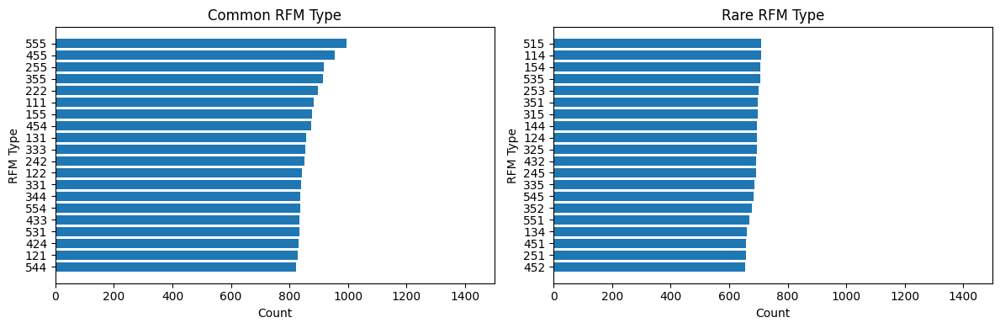

In [44]:
rfm_types = df_rfm_agg['RFM_Score'].value_counts()
top20 = rfm_types[:20]
bottom20 = rfm_types[-20:]
fig, axes = plt.subplots(1,2, figsize = (12, 4))
axes[0].barh(top20.index, top20.values)
axes[0].set_xlabel('Count')
axes[0].set_ylabel('RFM Type')
axes[0].set_title('Common RFM Type')
axes[0].set_xlim(0, 1500)
axes[0].invert_yaxis()
axes[1].barh(bottom20.index, bottom20.values)
axes[1].set_xlabel('Count')
axes[1].set_ylabel('RFM Type')
axes[1].set_title('Rare RFM Type')
axes[1].set_xlim(0, 1500)
axes[1].invert_yaxis()
plt.tight_layout()
plt.show()

대체로 RFM의 평균이 높은 값이 빈도가 높음

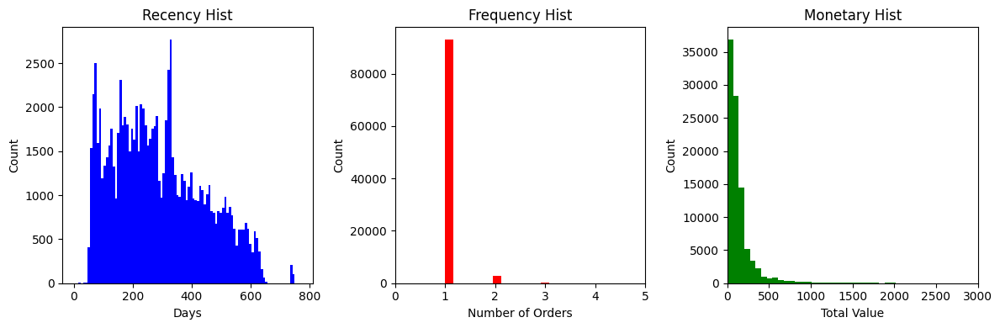

In [45]:
fig, axes = plt.subplots(1, 3, figsize = (12, 4))
axes[0].hist(df_rfm_agg['Recency'], bins = 100, color = 'Blue')
axes[0].set_title('Recency Hist')
axes[0].set_xlabel('Days')
axes[0].set_ylabel('Count')
axes[1].hist(df_rfm_agg['Frequency'], bins = 100, color = 'Red')
axes[1].set_title('Frequency Hist')
axes[1].set_xlabel('Number of Orders')
axes[1].set_ylabel('Count')
axes[1].set_xlim(0, 5)
axes[2].hist(df_rfm_agg['Monetary'], bins = 200, color = 'Green')
axes[2].set_title('Monetary Hist')
axes[2].set_xlabel('Total Value')
axes[2].set_ylabel('Count')
axes[2].set_xlim(0, 3000)
plt.tight_layout()
plt.show()

**Recency** : 1년 내에 구매를 한 손님이 주를 이루며, 전체적으로 우하강 그래프  
**Frequency** : 주로 1회 구매  
**Monetary** : 500달러 이하의 소액구매가 많음

/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_vals = vals.groupby(grouper)
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:641: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_

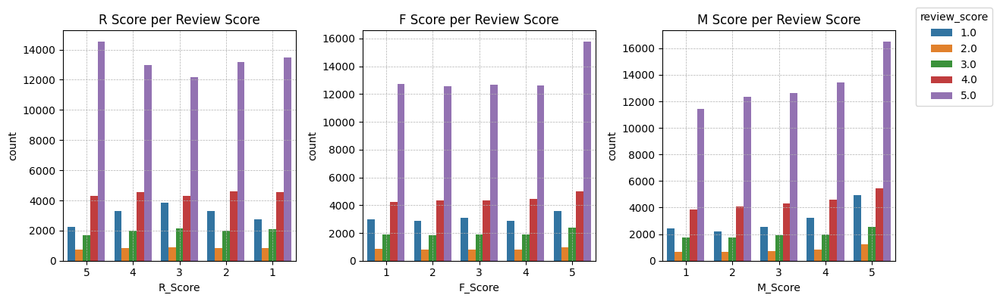

In [46]:
fig, axes = plt.subplots(1, 3, figsize = (12, 4))
sns.countplot(x = 'R_Score', hue = 'review_score', data = df_merged, ax = axes[0])
axes[0].set_title('R Score per Review Score')
axes[0].grid(linestyle = '--', linewidth = 0.5)
sns.countplot(x = 'F_Score', hue = 'review_score', data = df_merged, ax = axes[1])
axes[1].set_title('F Score per Review Score')
axes[1].grid(linestyle = '--', linewidth = 0.5)
sns.countplot(x = 'M_Score', hue = 'review_score', data = df_merged, ax = axes[2])
axes[2].set_title('M Score per Review Score')
axes[2].grid(linestyle = '--', linewidth = 0.5)
handles, labels = axes[2].get_legend_handles_labels()
for ax in axes:
    ax.get_legend().remove()
plt.tight_layout()
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.1, 1), title = 'review_score')
plt.show()

F, M점수에 대해서는 전체적으로 우상향 그래프  
R점수는 리뷰점수 5점에선 U모양의 대칭적 구조, 그 이하로는 점수가 내려갈 수록 ∩모양의 대칭적 구조  
특히 R점수가 3점일 때, 리뷰 점수의 평균이 제일 낮음 

In [47]:
df_merged.groupby('R_Score', observed=True)[['delivery_time', 'review_score']].describe()

delivery_time                                                          \
                count                        mean                         std   
R_Score                                                                         
5               23192   8 days 07:43:51.265134529   5 days 21:03:04.653570267   
4               23356  12 days 06:52:38.820431580   9 days 09:34:15.139172186   
3               22995  15 days 00:57:33.837486410  10 days 21:09:18.723875130   
2               23361  12 days 13:38:06.884037498   8 days 21:21:46.617760128   
1               22803  12 days 01:40:55.178923826  10 days 00:30:25.714828453   

                                                                            \
                       min                     25%                     50%   
R_Score                                                                      
5        -6 days +23:00:14  4 days 18:49:00.250000  7 days 01:59:17.500000   
4        -2 days +19:14:37         6 days 00:43:55  9 days 17:49:03.500000   
3        -4 days +20:38:51         7 days 19:22:55        12 days 16:00:56   
2        -7 days +00:14:54         7 days 00:42:04        10 days 16:17:32   
1        -5 days +03:35:40  6 days 23:03:11.500000        10 days 03:15:00   

                                                    review_score            \
                             75%                max        count      mean   
R_Score                                                                      
5        10 days 08:39:12.750000  136 days 18:31:15      23504.0  4.198690   
4               16 days 02:16:07  143 days 09:44:11      23682.0  3.974749   
3        19 days 06:48:31.500000  208 days 08:07:53      23356.0  3.859008   
2               15 days 12:58:50  171 days 06:50:25      23917.0  3.981185   
1               14 days 12:36:48  208 days 12:01:24      23687.0  4.063832   

                                            
              std  min  25%  50%  75%  max  
R_Score                                     
5        1.278883  1.0  4.0  5.0  5.0  5.0  
4        1.424462  1.0  3.0  5.0  5.0  5.0  
3        1.492731  1.0  3.0  5.0  5.0  5.0  
2        1.420579  1.0  3.0  5.0  5.0  5.0  
1        1.354087  1.0  4.0  5.0  5.0  5.0

In [48]:
df_merged[df_merged['review_score'] == 1].groupby(['R_Score', 'review_score'], observed=True)['delivery_time'].describe()

,,count,mean,std,min,25%,50%,75%,max
R_Score,review_score,,,,,,,,
5,1.0,1969,11 days 07:31:21.047739969,9 days 13:06:09.945375254,-5 days +03:07:11,5 days 15:47:15,8 days 15:41:31,13 days 04:34:51,88 days 05:35:56
4,1.0,2974,19 days 13:21:26.593813046,14 days 01:35:50.761157064,-1 days +23:17:48,8 days 00:34:30.500000,16 days 00:05:40.500000,28 days 13:22:16.250000,106 days 16:23:57
3,1.0,3380,23 days 23:40:40.536094674,16 days 01:51:15.964823488,1 days 02:47:18,11 days 00:28:27,21 days 00:41:38,34 days 01:24:16.500000,191 days 10:20:16
2,1.0,2764,19 days 06:29:18.849131693,14 days 19:44:14.414301874,-6 days +22:09:41,8 days 18:29:36.500000,14 days 08:41:31,27 days 05:02:37,165 days 00:06:53
1,1.0,2034,17 days 12:53:31.210914454,16 days 10:28:40.724351848,1 days 00:44:19,8 days 07:16:08,13 days 00:17:46.500000,20 days 12:03:04.250000,194 days 15:12:24


R점수가 3점일 때, 배송시간의 평균은 다른 점수보다 약 3일 정도 더 김  
특히 리뷰점수가 1일 때를 보면 배송시간의 평균이 23일로 가장 긴 것을 알 수 있음  
R점수가 3점인 고객들이 상품을 구매하는 특정기간에 행사 및 이벤트 등으로 인해 배송이 몰려 시간이 지연된 것으로 예측

/tmp/ipykernel_39/2805621689.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_ts.resample('M').mean()


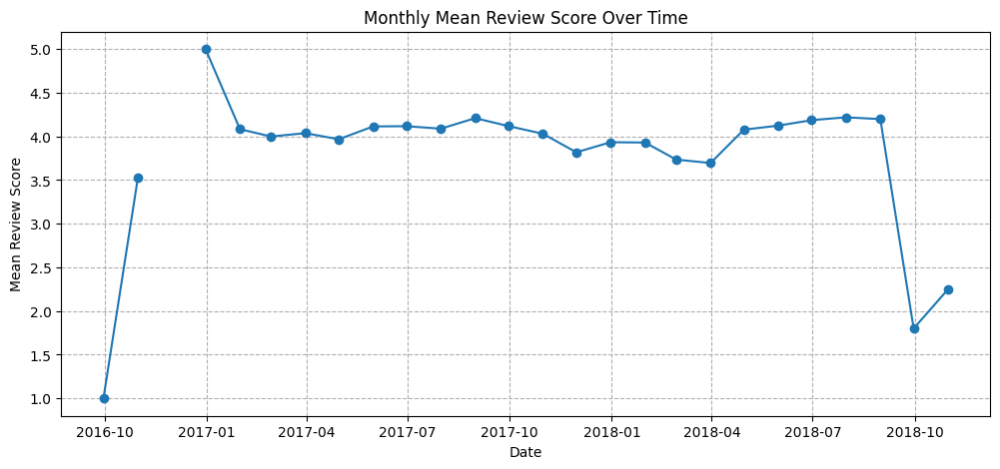

In [49]:
df_ts = df_merged.set_index('order_purchase_timestamp')['review_score']
df_monthly_mean = df_ts.resample('M').mean()

plt.figure(figsize=(12, 5))
plt.plot(df_monthly_mean.index, df_monthly_mean.values, marker='o', linestyle='-')
plt.title('Monthly Mean Review Score Over Time')
plt.xlabel('Date')
plt.ylabel('Mean Review Score')
plt.grid(linestyle = '--')
plt.show()

서비스 안정기(2017-2018) 동안 평균 4.0점의 리뷰 점수를 유지  
2017년 전, 2018년 9월 이후의 낮은 리뷰 점수는 데이터의 수집과 관련된 문제로 분석에서 유의미하게 고려하지 않음

## 고객 분포 경향 분석

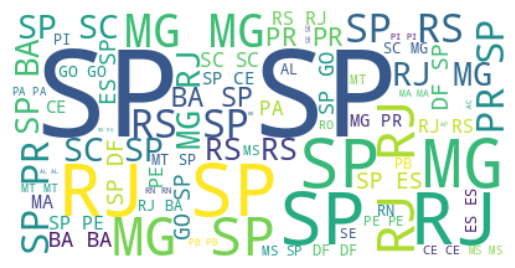

In [50]:
alice_novel = df_merged['customer_state'].str.cat(sep=' ')
stopwords = set(STOPWORDS)

alice_wc = WordCloud(background_color='white', stopwords=stopwords)
alice_wc.generate(alice_novel)

plt.figure()
plt.imshow(alice_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

SP 지역에 가장 분포가 많은 걸 확인할 수 있음

In [51]:
brazil_location = [-14.2350, -51.9253]
bm = folium.Map(location = brazil_location, zoom_start = 4)
heat_data = df_merged.dropna(subset=['geolocation_lat', 'geolocation_lng'])[['geolocation_lat', 'geolocation_lng']].values
HeatMap(heat_data, radius = 17, blur = 12).add_to(bm)
bm

동쪽에 고객이 많이 분포하는 것을 확인할 수 있음

In [52]:
df = df_merged.groupby('customer_state')['price'].sum().reset_index()
df.head()

,customer_state,price
0,AC,17059.44
1,AL,83314.32
2,AM,22865.26
3,AP,13654.30
4,BA,543243.99


In [53]:
bgeo_path = '/kaggle/input/br-states/br_states.json'
bm = folium.Map(location = brazil_location, zoom_start = 4)
folium.Choropleth(
    geo_data=bgeo_path,
    data=df,
    columns=['customer_state', 'price'],
    key_on='feature.id',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Total Price by State'
).add_to(bm)
bm

In [54]:
df = df_merged[df_merged['RFM_Score'] == '555']
df.shape

(2059, 72)

In [55]:
df_vip_counts = df.groupby('customer_state')['customer_unique_id'].nunique().reset_index()
bm = folium.Map(location=brazil_location, zoom_start=4)
folium.Choropleth(
    geo_data=bgeo_path,
    data=df_vip_counts,
    columns=['customer_state', 'customer_unique_id'],
    key_on='feature.id',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='The Number of VIP by State'
).add_to(bm)
bm

돈을 많이 쓰는 지역과 VIP의 분포에 대해서 어느정도 동일한 경향을 보임  
따라서 해당 지역에 대해 마케팅 등의 서비스를 강화할 수 있음

## 리뷰점수 분석
리뷰점수에 영향을 주는 요인피처 탐색 및 원인 분석

Mean of Review : 4.015582414978078


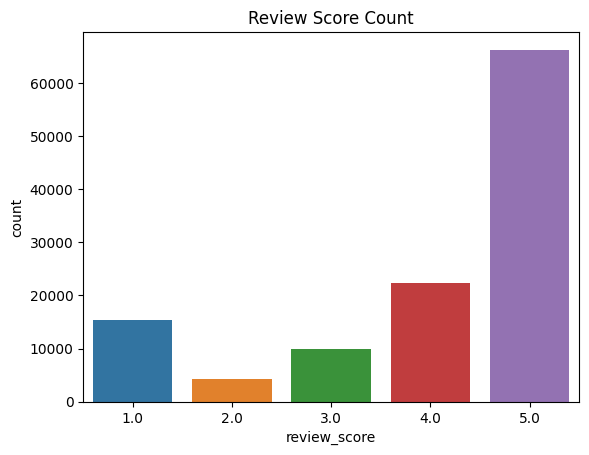

In [56]:
print('Mean of Review :', df_merged['review_score'].mean())
plt.figure()
sns.countplot(x = 'review_score', data = df_merged)
plt.title('Review Score Count')
plt.show()

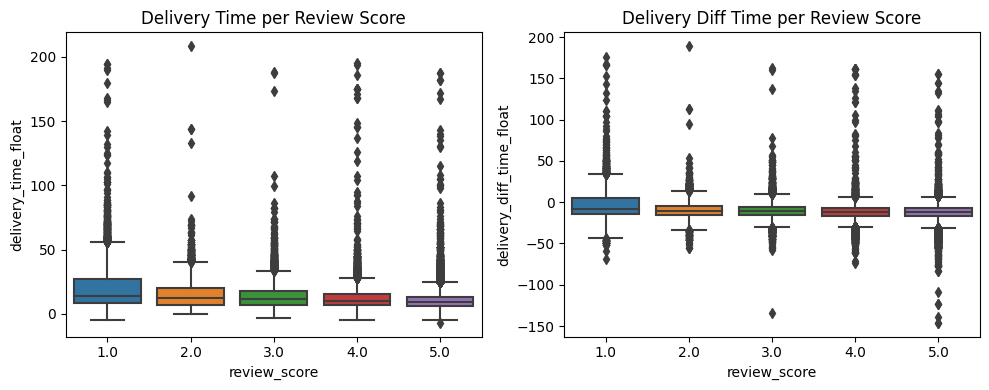

In [57]:
df_merged['delivery_time_float'] = df_merged['delivery_time'].dt.total_seconds() / (24 * 60 * 60)
df_merged['delivery_diff_time_float'] = df_merged['delivery_diff_time'].dt.total_seconds() / (24 * 60 * 60)

fig, axes = plt.subplots(1, 2, figsize = (10, 4))
sns.boxplot(x = 'review_score', y = 'delivery_time_float', data = df_merged, ax = axes[0])
axes[0].set_title('Delivery Time per Review Score')
sns.boxplot(x = 'review_score', y = 'delivery_diff_time_float', data = df_merged, ax = axes[1])
axes[1].set_title('Delivery Diff Time per Review Score')
plt.tight_layout()
plt.show()

배송시간과 리뷰점수는 상관관계를 가짐  
리뷰점수 5, 4점에서 배송시간은 큰 편차를 보이지 않지만, 점수가 내려갈수록 높은 편차를 보임  
동시에 리뷰점수에 따라 평균 배송시간도 반비례한 차이를 보임  
마찬가지로 예상배송과의 시간 차이에 대한 지표에서도 리뷰점수가 높을수록 예상배송보다 빨리 도착했다는 걸 보여줌

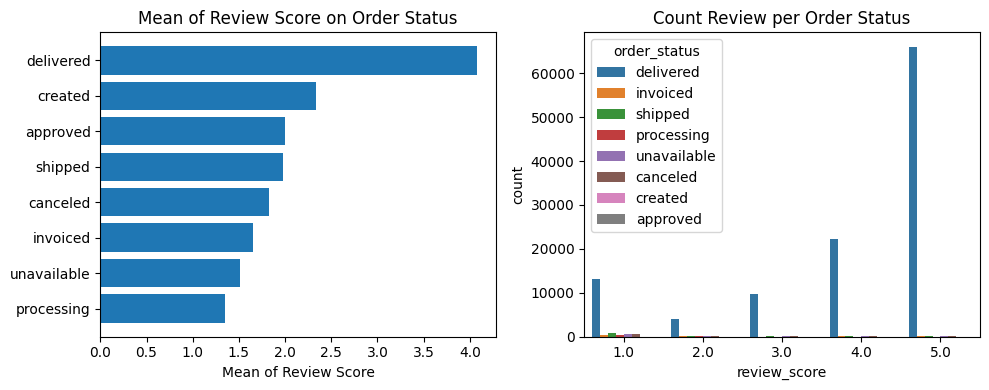

In [58]:
order_review_mn = df_merged.groupby('order_status')['review_score'].mean().sort_values()
fig, axes = plt.subplots(1, 2, figsize = (10, 4))
axes[0].barh(order_review_mn.index, order_review_mn)
axes[0].set_xlabel('Mean of Review Score')
axes[0].set_title('Mean of Review Score on Order Status')
sns.countplot(x = 'review_score', hue = 'order_status', data = df_merged, ax = axes[1])
axes[1].set_title('Count Review per Order Status')
plt.tight_layout()
plt.show()

배달이 완료되었을 때는 약 4점으로 높은 리뷰점수를 보이지만 나머지의 경우는 모두 2.5점 아래로 배달에 문제가 있어 리뷰점수도 낮게 나왔을 것이라고 추측

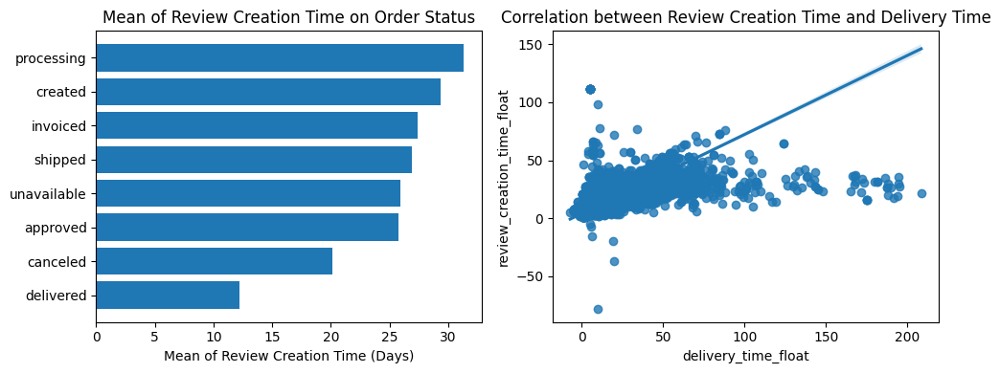

In [59]:
df_merged['review_creation_time_float'] = df_merged['review_creation_time'].dt.total_seconds() / (24 * 60 * 60)
os_rct_mn = df_merged.groupby('order_status')['review_creation_time_float'].mean().sort_values()

fig, axes = plt.subplots(1, 2, figsize = (10, 4))
axes[0].barh(os_rct_mn.index, os_rct_mn)
axes[0].set_xlabel('Mean of Review Creation Time (Days)')
axes[0].set_title('Mean of Review Creation Time on Order Status')
sns.regplot(x = 'delivery_time_float', y = 'review_creation_time_float', data = df_merged, ax = axes[1])
axes[1].set_title('Correlation between Review Creation Time and Delivery Time')
plt.tight_layout()
plt.show()

delivered에 비해 나머지 항목들은 리뷰 생성 시기가 더 늦음  
리뷰 생성 시기와 배달 시간에 대해서 양의 상관관계를 보이므로 delivered 제외 리뷰 평점이 낮은 것은 배달에 문제가 있었기 때문

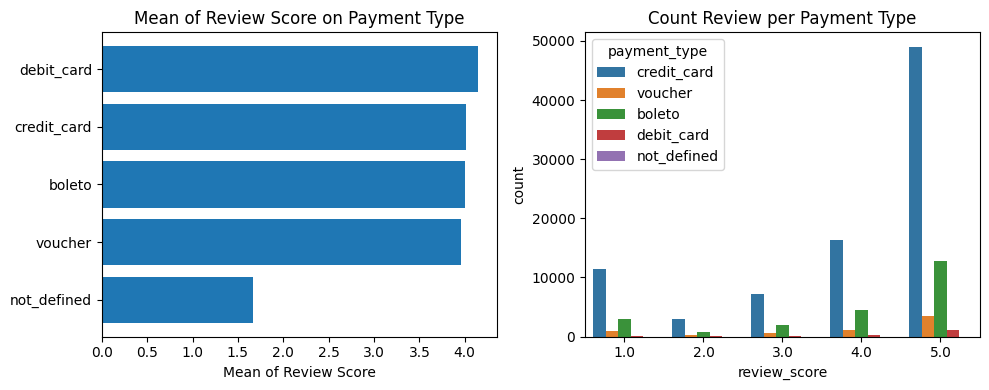

In [60]:
payment_review_mn = df_merged.groupby('payment_type')['review_score'].mean().sort_values()
fig, axes = plt.subplots(1, 2, figsize = (10, 4))
axes[0].barh(payment_review_mn.index, payment_review_mn)
axes[0].set_xlabel('Mean of Review Score')
axes[0].set_title('Mean of Review Score on Payment Type')
sns.countplot(x = 'review_score', hue = 'payment_type', data = df_merged, ax = axes[1])
axes[1].set_title('Count Review per Payment Type')
plt.tight_layout()
plt.show()

not_defined를 제외한 payment type은 모두 약 4.0의 높은 리뷰 평점을 보여줌  
왜 not_defined만 낮은지 분석 필요

In [61]:
df_merged[df_merged['payment_type'] == 'not_defined'].head()

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pan

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_purchase_year,order_purchase_month,...,geolocation_lat,geolocation_lng,review_creation_time,R_Score,F_Score,M_Score,RFM_Score,delivery_time_float,delivery_diff_time_float,review_creation_time_float
1362,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaT,NaT,NaT,2018-09-12,2018,8,...,-23.531642,-46.656289,-1 days +08:33:21,5,2,1,521,NaN,NaN,-0.643507
47855,4637ca194b6387e2d538dc89b124b0ee,a73c1f73f5772cf801434bf984b0b1a7,canceled,2018-09-03 14:14:25,NaT,NaT,NaT,2018-09-10,2018,9,...,-23.663211,-46.693516,-18 days +09:45:35,5,3,1,531,NaN,NaN,-17.593345
48231,c8c528189310eaa44a745b8d9d26908b,197a2a6a77da93f678ea0d379f21da0a,canceled,2018-08-28 20:05:14,NaT,NaT,NaT,2018-09-11,2018,8,...,-23.508136,-46.434033,-5 days +03:54:46,5,5,2,552,NaN,NaN,-4.836968


not_defined는 세 항만 존재했으며 order status는 모두 canceled로, 즉, 유효하지 않은 결제 수단 혹 결제 오류로 인한 결제 실패로 정의  
이에 따라 리뷰 평점은 낮게 나오게 됨

## VIP와 이탈 위험 고객 분석

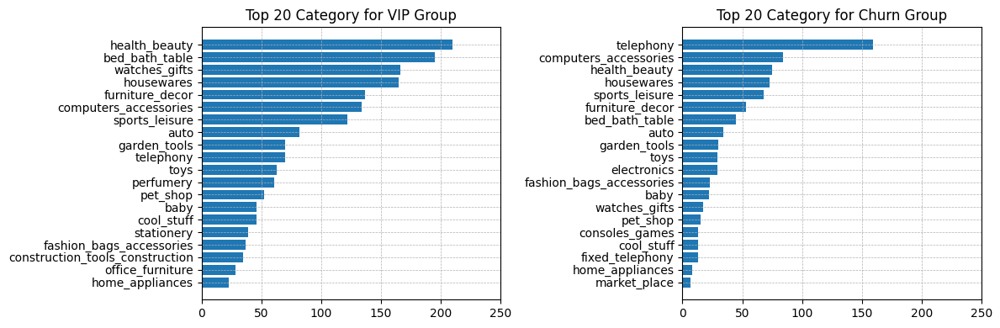

In [62]:
df_vip = df_merged[df_merged['RFM_Score'] == '555']
df_vip_vc = df_vip['product_category_name_english'].value_counts().sort_values(ascending = False)[:20]
df_churn = df_merged[df_merged['RFM_Score'] == '111']
df_churn_vc = df_churn['product_category_name_english'].value_counts().sort_values(ascending = False)[:20]

fig, axes = plt.subplots(1, 2, figsize = (12, 4))
axes[0].barh(df_vip_vc.index, df_vip_vc)
axes[0].invert_yaxis()
axes[0].set_xlim(0, 250)
axes[0].set_title('Top 20 Category for VIP Group')
axes[0].grid(linestyle = '--', linewidth = 0.5)
axes[1].barh(df_churn_vc.index, df_churn_vc)
axes[1].invert_yaxis()
axes[1].set_xlim(0, 250)
axes[1].set_title('Top 20 Category for Churn Group')
axes[1].grid(linestyle = '--', linewidth = 0.5)
plt.tight_layout()
plt.show()

VIP 그룹은 health beauty나 bed bath table, watches 등 다양한 카테고리에서 빈번한 소비를 보여줌  
반면 이탈 위험 그룹(Churn)은 telephony, computer accessories, healty beauty 등의 카테고리에서 소비를 하며 전체적으로 VIP 그룹에 비해 현저히 적음

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


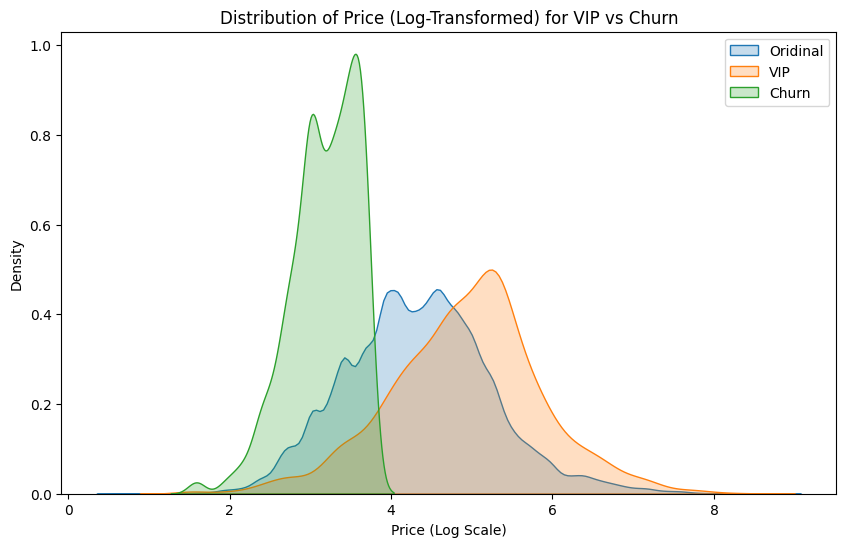

In [63]:
plt.figure(figsize = (10, 6))
sns.kdeplot(np.log1p(df_merged['price'].dropna()), label = 'Oridinal', fill = True)
sns.kdeplot(np.log1p(df_vip['price'].dropna()), label = 'VIP', fill = True)
sns.kdeplot(np.log1p(df_churn['price'].dropna()), label = 'Churn', fill = True)
plt.title('Distribution of Price (Log-Transformed) for VIP vs Churn')
plt.xlabel('Price (Log Scale)')
plt.legend()
plt.show()

가격의 분포가 왼쪽으로 쏠려있어 로그화를 통해 중앙 중심으로 분포화를 시킴  
VIP 그룹은 다양한 가격대에서 소비가 이루어지고 특히 평균보다 고가격대의 소비를 보여줌  
Churn 그룹은 저가격대에 소비가 집중분포되어있음

In [64]:
print('Mean of Review Score for All   :', df_merged['review_score'].mean())
print('Mean of Review Score for VIP   :', df_vip['review_score'].mean())
print('Mean of Review Score for Churn :', df_churn['review_score'].mean())

Mean of Review Score for All   : 4.015582414978078
Mean of Review Score for VIP   : 4.174890083048363
Mean of Review Score for Churn : 4.106175514626218


VIP와 Churn 모두 평균보다 높은 리뷰평점을 보유, 이는 곧 만족도와 충성도가 서로 다르다는 것을 보여줌  
따라서 서비스 및 상품에 대해 만족은 했지만 이탈하는 고객이 다수 존재, 즉 재구매로 이끌지 못하고 있음  
또한 VIP 그룹은 Churn보다 높은 리뷰평점을 보여줌